### import library

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression  
from sklearn.ensemble import RandomForestRegressor 
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.svm import SVR  
import lightgbm as lgb 
from xgboost import XGBRFRegressor

from sklearn.model_selection import train_test_split 
from sklearn.metrics import mean_squared_error 

from sklearn.model_selection import learning_curve
from sklearn.model_selection import ShuffleSplit
import warnings
warnings.filterwarnings('ignore')

In [2]:
all_data = pd.read_csv('./processed_data_2.csv')

cond = all_data['label'] == 'train'
train_data = all_data[cond]
train_data.drop(labels = 'label',axis = 1,inplace = True)
X_train,X_valid,y_train,y_valid=train_test_split(train_data.drop(labels='target',axis = 1),
                                                 train_data['target'],
                                                 test_size=0.2)
cond2 = all_data['label'] == 'test'
test_data = all_data[cond2]
test_data.drop(labels = ['label','target'],axis = 1,inplace = True)

In [3]:
all_data

,V0,V1,V2,V3,V4,V6,V7,V8,V10,V12,...,V24,V27,V29,V30,V31,V35,V36,V37,target,label
0,4.147084,5.841184,0.918479,0.921088,1.205738,1.864357,1.568184,3.799373,0.262782,1.495579,...,0.531587,8923.054505,0.300080,1.788352,15.555187,0.519843,0.000000,0.018284,0.175,train
1,4.988271,7.279840,0.984897,0.964538,1.110508,2.148236,1.568184,5.377115,0.493786,1.463960,...,0.531820,11039.701316,0.280397,1.800049,21.939731,9.178637,0.369734,0.407834,0.676,train
2,5.090224,7.783637,1.040170,0.911078,1.081218,2.401542,1.568184,5.529584,0.655989,1.496101,...,0.569035,10875.927640,0.289379,1.992162,24.904398,9.178637,0.611879,0.426451,0.633,train
3,4.481728,7.025646,1.056127,0.856314,1.262126,2.631664,1.888754,5.546473,0.454651,1.526601,...,0.677685,10230.746478,0.291168,2.039607,24.929990,9.178637,0.511483,0.488736,0.206,train
4,4.381416,8.064594,1.048467,0.867969,1.162709,2.818014,1.888754,5.334858,0.398723,1.642254,...,0.550463,10957.524880,0.303493,2.663214,25.564331,9.178637,0.380802,0.499597,0.384,train
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4710,1.507318,2.366075,0.192182,0.700533,1.179061,0.138338,0.043709,0.440800,0.004467,1.754458,...,0.184800,749.697250,0.302625,0.002497,0.448108,2.996210,0.005636,0.579449,NaN,test
4711,0.607637,0.591671,0.100980,0.552034,0.623189,0.122522,0.084880,0.334212,0.008009,0.766166,...,0.291031,649.875342,0.377223,1.285751,0.000000,2.996210,0.005636,0.656833,NaN,test
4712,0.648457,0.535177,0.137667,0.705981,0.653005,0.308269,0.291171,0.133988,0.007462,1.000486,...,0.591230,851.669065,0.329385,1.800831,0.324084,3.987778,0.008216,0.705772,NaN,test
4713,0.625626,0.496193,0.160569,0.638362,0.653539,0.497144,0.493672,0.238140,0.003246,0.862510,...,0.531587,1091.648345,0.313149,2.671518,0.722675,3.987778,0.007570,0.683533,NaN,test


In [4]:
train_data_pca = np.load('./train_data_pca.npz')['X_train']
target_data_pca = np.load('./train_data_pca.npz')['y_train']

X_train_pca,X_valid_pca,y_train_pca,y_valid_pca=train_test_split(train_data_pca,target_data_pca,
                                                               test_size=0.2)
test_data_pca = np.load('./test_data_pca.npz')['X_test']

In [5]:
train_data_pca.shape

(2790, 22)

In [6]:
train_sizes=np.array([0.1  , 0.325, 0.55 , 0.775, 1.   ])
train_sizes

array([0.1  , 0.325, 0.55 , 0.775, 1.   ])

In [7]:
np.floor(X_train_pca.shape[0] * train_sizes * 0.75)

array([ 167.,  544.,  920., 1297., 1674.])

In [8]:
def plot_learning_curve(model,title,X,y,cv=None):
    
    train_sizes, train_scores, test_scores = learning_curve(model, X, y, cv=cv)
    print(train_sizes,train_scores.shape,test_scores.shape)
    
    # calculate the mean value and the standard deviation
    train_scores_mean = np.mean(train_scores, axis=1)
    train_scores_std = np.std(train_scores, axis=1)
    test_scores_mean = np.mean(test_scores, axis=1)
    test_scores_std = np.std(test_scores, axis=1)
    
    plt.plot(train_sizes, train_scores_mean, 'o-', color="r",
             label="Training score")
    plt.fill_between(train_sizes, train_scores_mean - train_scores_std,
                     train_scores_mean + train_scores_std, alpha=0.1,color="r")
    
    plt.plot(train_sizes, test_scores_mean, 'o-', color="g",
             label="Cross-validation score")
    plt.fill_between(train_sizes, test_scores_mean - test_scores_std,
                     test_scores_mean + test_scores_std, alpha=0.1, color="g")
    plt.grid() 
    plt.legend(loc="best") 
    plt.title(title)
    plt.xlabel("Training examples")
    plt.ylabel("Score")

### linear regression

In [9]:
clf = LinearRegression()
clf.fit(X_train_pca, y_train_pca)
score = mean_squared_error(y_valid_pca, clf.predict(X_valid_pca))
print("LinearRegression:   ", score)

LinearRegression:    0.11110315635337614


In [10]:
clf = LinearRegression()
clf.fit(X_train, y_train)
score = mean_squared_error(y_valid, clf.predict(X_valid))
print("LinearRegression:   ", score)

LinearRegression:    0.10367767801805057


#### plot_learning_curve

learning curve shows the validation and training score of an estimator for varying numbers of training samples. It is a tool to find out how much we benefit from adding more training data and whether the estimator suffers more from a variance error or a bias error.
overfitting: high variance
underfitting: high bias

[ 167  544  920 1297 1674] (5, 100) (5, 100)


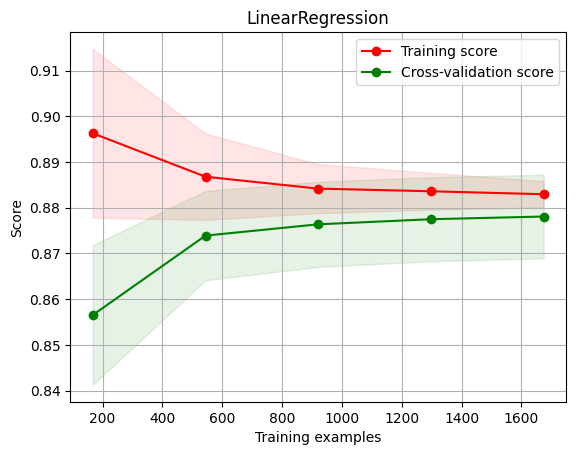

In [11]:
X = X_train_pca
y = y_train_pca
title = "LinearRegression"

cv = ShuffleSplit(n_splits=100, test_size=0.25)

estimator = LinearRegression()    

plot_learning_curve(estimator, title, X, y, cv = cv)


[ 111  362  613  864 1116] (5, 100) (5, 100)


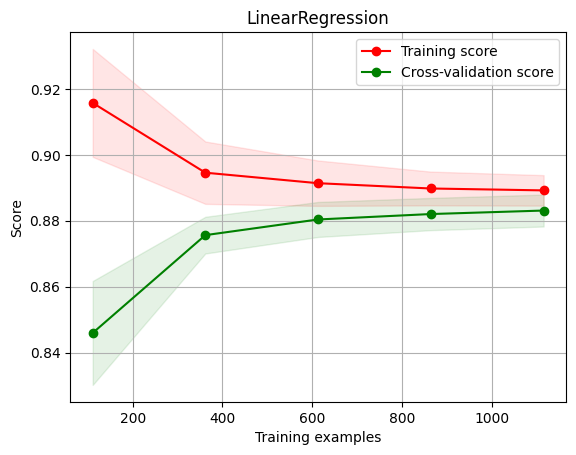

In [12]:
X = X_train
y = y_train
title = "LinearRegression"
cv = ShuffleSplit(n_splits=100, test_size=0.5)
estimator = LinearRegression()    
plot_learning_curve(estimator, title, X, y, cv = cv)

In [13]:
model = LinearRegression()
model.fit(train_data_pca,target_data_pca)
y_ = model.predict(test_data_pca)
display(y_)
np.savetxt('./liner_regression_model_predict(pca).txt',y_)

array([ 0.1900706 ,  0.24559791, -0.1507814 , ..., -2.46532551,
       -2.5159793 , -2.22523231])

In [14]:
model = LinearRegression()
model.fit(train_data.drop('target',axis = 1),train_data['target'])
y_ = model.predict(test_data)
display(y_)
np.savetxt('./liner_regression_model_predict(non_pca).txt',y_)

array([ 0.18229694,  0.21657368, -0.16797796, ..., -2.44426677,
       -2.44621898, -2.0563295 ])

### random forest

In [15]:
model = RandomForestRegressor(n_estimators=200, 
                            max_depth= 10,
                            min_samples_leaf=10,
                            min_samples_split=40,
                            criterion='squared_error')
model.fit(X_train_pca, y_train_pca)
score = mean_squared_error(y_valid_pca, model.predict(X_valid_pca))
print("random forest:   ", score)

random forest:    0.16527634435147526


In [16]:
model = RandomForestRegressor(n_estimators=200, 
                            max_depth= 10,
                            min_samples_leaf=10,
                            min_samples_split=40,
                            criterion='squared_error')
model.fit(X_train, y_train)
score = mean_squared_error(y_valid, model.predict(X_valid))
print("random forest:   ", score)

random forest:    0.11329406209789633


In [17]:
model =  RandomForestRegressor(n_estimators=200,
                            max_depth= 10,
                            min_samples_leaf=10,
                            min_samples_split=40,
                            criterion='squared_error')
model.fit(train_data_pca,target_data_pca)
y_ = model.predict(test_data_pca)
display(y_)
np.savetxt('./random_forest_model_predict(pca).txt',y_)

array([ 0.30748672,  0.21467953, -0.17773439, ..., -2.39901532,
       -2.43216093, -2.32208387])

In [18]:
model = RandomForestRegressor(n_estimators=200,
                            max_depth= 10,
                            min_samples_leaf=10,
                            min_samples_split=40,
                            criterion='squared_error')
model.fit(train_data.drop('target',axis = 1),train_data['target'])
y_ = model.predict(test_data)
display(y_)
np.savetxt('./random_forest_model_predict(non_pca).txt',y_)

array([ 0.31152012,  0.17407558, -0.06639107, ..., -2.66643499,
       -2.66922703, -2.65286536])

### SVR

In [19]:
model = SVR(kernel='rbf',C = 1,gamma=0.01,tol = 0.0001,epsilon=0.3)
model.fit(X_train_pca, y_train_pca)
score = mean_squared_error(y_valid_pca, model.predict(X_valid_pca))
print("SVR support vector machine:   ", score)

SVR support vector machine:    0.11036328098640677


In [20]:
model = SVR(kernel='rbf')
model.fit(X_train, y_train)
score = mean_squared_error(y_valid, model.predict(X_valid))
print("SVR support vector machine:   ", score)

SVR support vector machine:    0.2702959328809732


[ 111  362  613  864 1116] (5, 100) (5, 100)


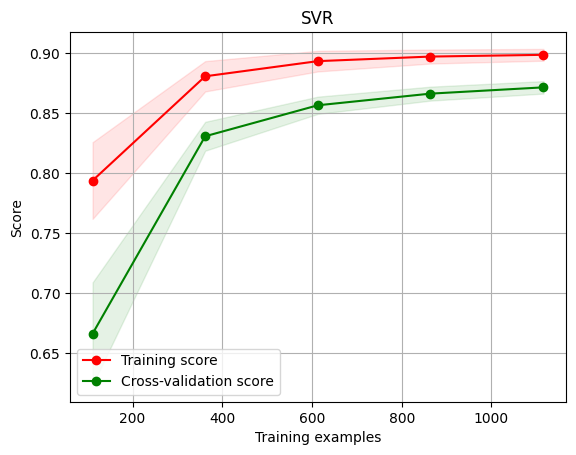

In [21]:
X = X_train_pca
y = y_train_pca
title = "SVR"
cv = ShuffleSplit(n_splits=100, test_size=0.5)
model = SVR(kernel='rbf',C = 1,gamma=0.01,tol = 0.0001,epsilon=0.3)
plot_learning_curve(model, title, X, y, cv = cv)

[ 111  362  613  864 1116] (5, 100) (5, 100)


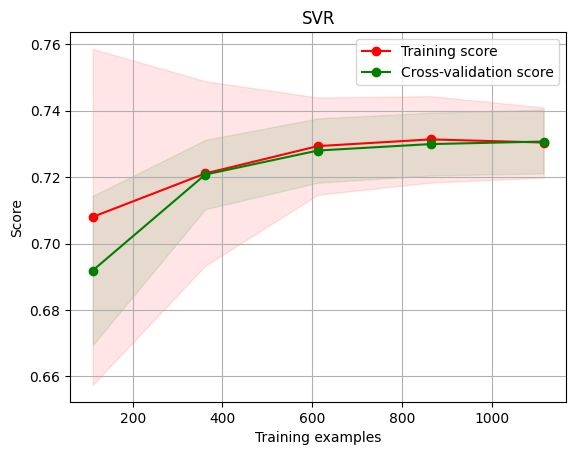

In [22]:
X = X_train
y = y_train
title = "SVR"
cv = ShuffleSplit(n_splits=100, test_size=0.5)
model = SVR(kernel='rbf')
plot_learning_curve(model, title, X, y, cv = cv)

In [23]:
model =  SVR(kernel='rbf',C = 1,gamma=0.01,tol = 0.0001,epsilon=0.3)
model.fit(train_data_pca,target_data_pca)
y_ = model.predict(test_data_pca)
display(y_)
np.savetxt('./SVR_model_predict(pca).txt',y_)

array([ 0.2665878 ,  0.25774943, -0.09110797, ..., -2.21395763,
       -2.31255199, -2.16525396])

In [24]:
model =SVR(kernel='rbf')
model.fit(train_data.drop('target',axis = 1),train_data['target'])
y_ = model.predict(test_data)
display(y_)
np.savetxt('./SVR_model_predict(non_pca).txt',y_)

array([ 0.02441319,  0.0802777 , -0.38080159, ..., -3.2785716 ,
       -3.20313377, -3.10649369])

In [25]:
model =  SVR(kernel='poly')
model.fit(train_data_pca,target_data_pca)
y_ = model.predict(test_data_pca)
display(y_)
np.savetxt('./SVR-poly_model_predict(pca).txt',y_)

array([ 0.19450864,  0.27023144,  0.15075083, ..., -4.68651739,
       -3.87777812, -2.84886579])

In [26]:
model =SVR(kernel='poly')
model.fit(train_data.drop('target',axis = 1),train_data['target'])
y_ = model.predict(test_data)
display(y_)
np.savetxt('./SVR-poly_model_predict(non_pca).txt',y_)

array([-0.06963903, -0.04263218, -0.21281139, ..., -0.45267275,
       -0.45235616, -0.45173898])

### GBDT

In [27]:
model = GradientBoostingRegressor(learning_rate=0.03, 
                                loss='huber',  
                                max_depth=14, 
                                max_features='sqrt',
                                min_samples_leaf=10,
                                min_samples_split=40,
                                n_estimators=300,
                                subsample=0.8)
model.fit(X_train_pca, y_train_pca)
score = mean_squared_error(y_valid_pca, model.predict(X_valid_pca))
print("GBDT score:   ", score)

GBDT score:    0.12755968651438712


In [28]:
model = GradientBoostingRegressor(learning_rate=0.03, 
                                loss='huber',  
                                max_depth=14, 
                                max_features='sqrt',
                                min_samples_leaf=10,
                                min_samples_split=40,
                                n_estimators=300,
                                subsample=0.8)
model.fit(X_train, y_train)
score = mean_squared_error(y_valid, model.predict(X_valid))
print("GBDT score:   ", score)

GBDT score:    0.08883810496680927


[ 111  362  613  864 1116] (5, 100) (5, 100)


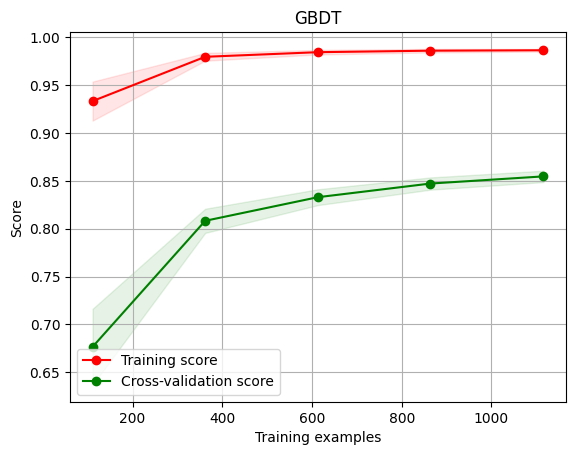

In [29]:
X = X_train_pca
y = y_train_pca
title = "GBDT"
cv = ShuffleSplit(n_splits=100, test_size=0.5)
model = GradientBoostingRegressor(learning_rate=0.03, 
                                loss='huber', 
                                max_depth=14, 
                                max_features='sqrt',
                                min_samples_leaf=10,
                                min_samples_split=40,
                                n_estimators=300,
                                subsample=0.8)
plot_learning_curve(model, title, X, y, cv = cv)

In [30]:

model =  GradientBoostingRegressor(learning_rate=0.03, 
                                loss='huber',  
                                max_depth=14, 
                                max_features='sqrt',
                                min_samples_leaf=10,
                                min_samples_split=40,
                                n_estimators=300,
                                subsample=0.8)
model.fit(train_data_pca,target_data_pca)
y_ = model.predict(test_data_pca)
display(y_)
np.savetxt('./GBDT_model_predict(pca).txt',y_)

array([ 0.39668962,  0.25935038,  0.09580111, ..., -1.63964989,
       -1.81875938, -1.73130119])

In [31]:
model = GradientBoostingRegressor(learning_rate=0.03, 
                                loss='huber', 
                                max_depth=14,
                                max_features='sqrt',
                                min_samples_leaf=10,
                                min_samples_split=40,
                                n_estimators=300,
                                subsample=0.8)
model.fit(train_data.drop('target',axis = 1),train_data['target'])
y_ = model.predict(test_data)
display(y_)
np.savetxt('./GBDT_model_predict(non_pca).txt',y_)

array([ 0.4401838 ,  0.39474923,  0.04305889, ..., -2.62812224,
       -2.80250615, -2.69756   ])

### lightGBM

In [32]:
model = lgb.LGBMRegressor(learning_rate=0.05, 
                        n_estimators=300,
                        min_child_samples=10,
                        max_depth=5, 
                        num_leaves = 25,
                        colsample_bytree =0.8,
                        subsample=0.8,
                        reg_alpha = 0.5,
                        reg_lambda = 0.1 )
model.fit(X_train_pca, y_train_pca)
score = mean_squared_error(y_valid_pca, model.predict(X_valid_pca))
print("LGB score:   ", score)

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000429 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5610
[LightGBM] [Info] Number of data points in the train set: 2232, number of used features: 22
[LightGBM] [Info] Start training from score 0.157063
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

In [33]:
model = lgb.LGBMRegressor(learning_rate=0.05, 
                        n_estimators=300,
                        min_child_samples=10,
                        max_depth=5, 
                        num_leaves = 25,
                        colsample_bytree =0.8,
                        subsample=0.8,
                        reg_alpha = 0.5,
                        reg_lambda = 0.1 )
model.fit(X_train, y_train)
score = mean_squared_error(y_valid, model.predict(X_valid))
print("LGB score:   ", score)

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000253 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6198
[LightGBM] [Info] Number of data points in the train set: 2232, number of used features: 25
[LightGBM] [Info] Start training from score 0.167186
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000120 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 916
[LightGBM] [Info] Number of data points in the train set: 111, number of used features: 25
[LightGBM] [Info] Start training from score 0.184477
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

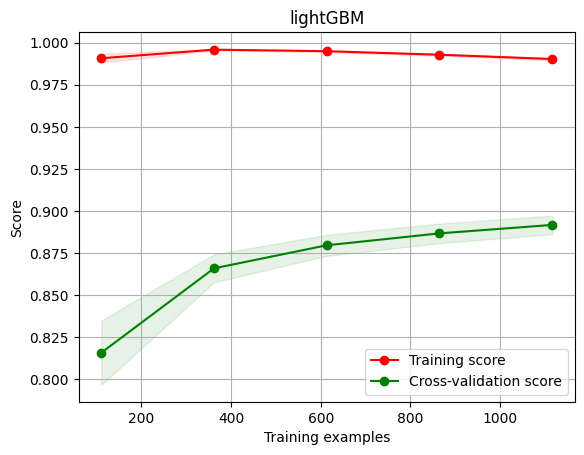

In [34]:
X = X_train
y = y_train
title = "lightGBM"
cv = ShuffleSplit(n_splits=100, test_size=0.5)
model = lgb.LGBMRegressor(learning_rate=0.05, 
                        n_estimators=300,
                        min_child_samples=10,
                        max_depth=5,
                        num_leaves = 25,
                        colsample_bytree =0.8,
                        subsample=0.8,
                        reg_alpha = 0.5,
                        reg_lambda = 0.1 )
plot_learning_curve(model, title, X, y, cv = cv)

In [35]:
model =  lgb.LGBMRegressor(learning_rate=0.05, 
                        n_estimators=100,
                        min_child_samples=10,
                        max_depth=5, 
                        num_leaves = 25,
                        colsample_bytree =0.8,
                        subsample=0.8,
                        reg_alpha = 0.5,
                        reg_lambda = 0.1 )
model.fit(train_data_pca,target_data_pca)
y_ = model.predict(test_data_pca)
display(y_)
np.savetxt('./lightGBM_model_predict(pca).txt',y_)

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000745 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5610
[LightGBM] [Info] Number of data points in the train set: 2790, number of used features: 22
[LightGBM] [Info] Start training from score 0.147570
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

array([ 0.29062203,  0.2910221 ,  0.06404592, ..., -1.91828675,
       -2.04002397, -1.78874395])

In [36]:
model = lgb.LGBMRegressor(learning_rate=0.05, 
                        n_estimators=100,
                        min_child_samples=10,
                        max_depth=5,
                        num_leaves = 25,
                        colsample_bytree =0.8,
                        subsample=0.8,
                        reg_alpha = 0.5,
                        reg_lambda = 0.1 )
model.fit(train_data.drop('target',axis = 1),train_data['target'])
y_ = model.predict(test_data)
display(y_)
np.savetxt('./lightGBM_model_predict(non_pca).txt',y_)

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000323 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6219
[LightGBM] [Info] Number of data points in the train set: 2790, number of used features: 25
[LightGBM] [Info] Start training from score 0.147570
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

array([ 0.32696072,  0.2505193 , -0.05821208, ..., -2.64736929,
       -2.65218812, -2.64107856])

### Xgboost

In [37]:
model = XGBRFRegressor(n_estimators = 300, 
                       max_depth=15,
                       subsample = 0.8,
                       colsample_bytree = 0.8,
                       learning_rate =1,
                       gamma = 0,
                       reg_lambda= 0 ,# L2 regularizer
                       reg_alpha = 0,verbosity=1)# L1 regularizer
model.fit(X_train_pca, y_train_pca)
score = mean_squared_error(y_valid_pca, model.predict(X_valid_pca))
print("Xgboost score:   ", score)

Xgboost score:    0.15461437072432793


In [38]:
model = XGBRFRegressor(n_estimators = 300, 
                       max_depth=15,
                       subsample = 0.8,
                       colsample_bytree = 0.8,
                       learning_rate =1,
                       gamma = 0,
                       reg_lambda= 0 ,
                       reg_alpha = 0,verbosity=1)
model.fit(X_train, y_train)
score = mean_squared_error(y_valid, model.predict(X_valid))
print("Xgboost score:   ", score)

Xgboost score:    0.09880308451615669


In [39]:
model = XGBRFRegressor(n_estimators = 300, 
                       max_depth=15,
                       subsample = 0.8,
                       colsample_bytree = 0.8,
                       learning_rate =1,
                       gamma = 0,
                       reg_lambda= 0 ,
                       reg_alpha = 0,verbosity=1)
model.fit(train_data_pca,target_data_pca)
y_ = model.predict(test_data_pca)
display(y_)
np.savetxt('./Xgboost_model_predict(pca).txt',y_)

array([ 0.40869606,  0.33833364,  0.10549418, ..., -1.6856022 ,
       -1.7076985 , -1.6487422 ], dtype=float32)

In [40]:
model = XGBRFRegressor(n_estimators = 300, 
                       max_depth=15,
                       subsample = 0.8,
                       colsample_bytree = 0.8,
                       learning_rate =1,
                       gamma = 0,
                       reg_lambda= 0 ,
                       reg_alpha = 0,verbosity=1)
model.fit(train_data.drop('target',axis = 1),train_data['target'])
y_ = model.predict(test_data)
display(y_)
np.savetxt('./Xgboost_model_predict(non_pca).txt',y_)

array([ 0.36972222,  0.20189627, -0.02811197, ..., -2.7376518 ,
       -2.773459  , -2.798211  ], dtype=float32)